<a href="https://colab.research.google.com/github/Jiayi1827/CS-446/blob/main/jiayix8_proj2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Programming Project #2: Image Quilting

## CS445: Computational Photography


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install python-utils

In [4]:
%cd /content/drive/MyDrive/CS 445/Project2/

/content/drive/MyDrive/CS 445/Project2


In [5]:
import sys
sys.path.append('/content/drive/MyDrive/CS 445/Project2')

In [16]:
import random

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time

# modify to where you store your project data including utils.py
datadir = "/content/drive/My Drive/CS 445/Project2/"

utilfn = datadir + "utils.py"
!cp "$utilfn" .
samplesfn = datadir + "samples"
!cp -r "$samplesfn" .
import utils

cp: '/content/drive/My Drive/CS 445/Project2/utils.py' and './utils.py' are the same file
cp: '/content/drive/My Drive/CS 445/Project2/samples' and './samples' are the same file


In [8]:
from utils import cut # default cut function for seam finding section

In [9]:
import torch
deviceGPU = torch.device('cuda')

### Part I: Randomly Sampled Texture (10 pts)

In [12]:
def quilt_random(sample, out_size, patch_size):
    """
    Randomly samples square patches of size patchsize from sample in order to create an output image of size outsize.

    :param sample: numpy.ndarray   The image you read from sample directory
    :param out_size: int            The width of the square output image
    :param patch_size: int          The width of the square sample patch
    :return: numpy.ndarray
    """
    # Initialization output as black
    out_img = np.zeros((out_size, out_size, 3), dtype=np.uint8)

    # get the height and width (slicing)
    sample_height, sample_width = sample.shape[:2]

    # Fill the output with patches one by one
    for j in range(0, out_size, patch_size):   # left to right
        for i in range(0, out_size, patch_size):  # up to bottom
            # Randomly select patch
            # Assume (x, y) represent the top-left corner of the patch
            x = random.randint(0, sample_width - patch_size)
            y = random.randint(0, sample_height - patch_size)
            patch = sample[y:y + patch_size, x:x + patch_size]


            # bottom-right corner of the patch
            end_i = i + patch_size
            end_j = j + patch_size
            if end_i > out_size or end_j > out_size:
                continue  # skip placing patches, so it remains black

            out_img[i:end_i, j:end_j] = patch

    return out_img


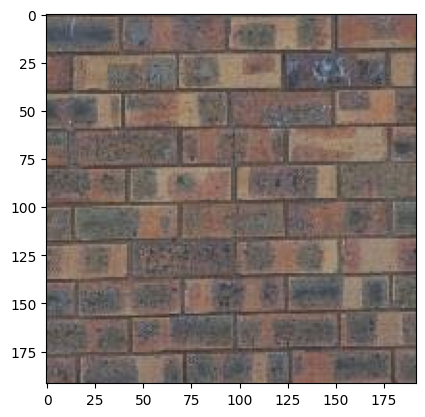

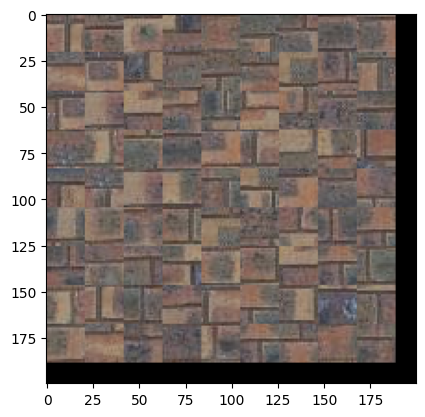

In [12]:
sample_img_fn = 'samples/bricks_small.jpg' # feel free to change
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 200  # change these parameters as needed
patch_size = 21
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
    plt.imshow(res)

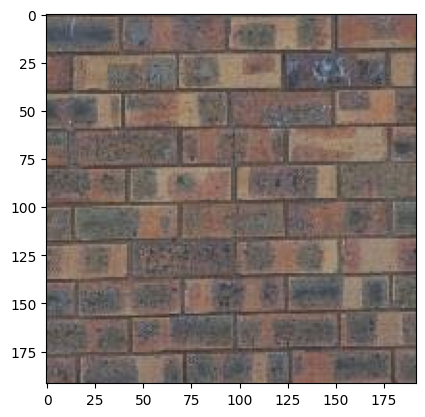

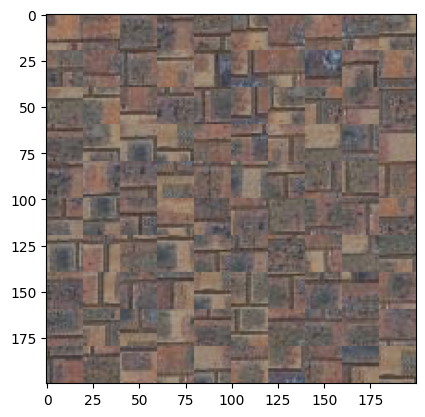

In [ ]:
# Patches fit evenly into the output image
sample_img_fn = 'samples/bricks_small.jpg' # feel free to change
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 200  # change these parameters as needed
patch_size = 20
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
    plt.imshow(res)

In [ ]:
sample_img.shape

(192, 192, 3)

### Part II: Overlapping Patches (30 pts)

In [61]:
import numpy as np
import cv2

def ssd_patch(T, M, I):
    T = T.astype(np.float64)
    I = I.astype(np.float64)
    M = M.astype(np.float64)
    ssd = np.zeros((I.shape[0], I.shape[1]))

    for i in range(3):
        ssd += ((M*T[:,:,i])**2).sum() - 2 * cv2.filter2D(I[:,:,i], ddepth=-1, kernel=M*T[:,:,i]) + cv2.filter2D(I[:,:,i] ** 2, ddepth=-1, kernel=M)

    border_width = T.shape[0] // 2
    border_height = T.shape[1] // 2
    ssd[:border_height, :] = np.inf
    ssd[-border_height:, :] = np.inf
    ssd[:, :border_width] = np.inf
    ssd[:, -border_width:] = np.inf

    # print(f"M shape: {M.shape}")
    # print(f"T shape: {T.shape}")
    # print(f"ssd shape: {ssd.shape}")
    return np.absolute(ssd)


def choose_sample(cost, tol):
    min_cost = np.amin(cost)

    candidates = np.where(cost <= min_cost * (1 + tol))

    # flatten
    candidate_indices = np.array(list(zip(candidates[0], candidates[1])))

    # Randomly select one
    row, col = candidate_indices[np.random.choice(len(candidate_indices))]

    # get the tope left coordinates
    patch_x = row - patch_size // 2
    patch_y = col - patch_size // 2

    return (patch_x, patch_y)



def quilt_simple(sample, out_size, patch_size, overlap, tol):
    output = np.zeros((out_size, out_size, 3))

    for i in range(0, out_size-patch_size, patch_size - overlap):
        for j in range(0, out_size-patch_size, patch_size - overlap):

            # create mask for overlapping regions
            mask = np.zeros((patch_size, patch_size), dtype=np.float64)
            if i > 0:  # If not the first row
                mask[:overlap, :] = 1
            if j > 0:  # If not the first column
                mask[:, :overlap] = 1

            T = output[i:i+patch_size, j:j+patch_size, :].copy()
            ssd = ssd_patch(T, mask, sample)

            # select the patch with low SSD cost (row&col：patch top left coordinates)
            (row, col) = choose_sample(ssd, tol)

            # place the chosen patch into the output image
            if i + patch_size < out_size or j + patch_size < out_size:
                output[i:i+patch_size, j:j+patch_size, :] = sample[row:row+patch_size, col:col+patch_size, :]


    return output




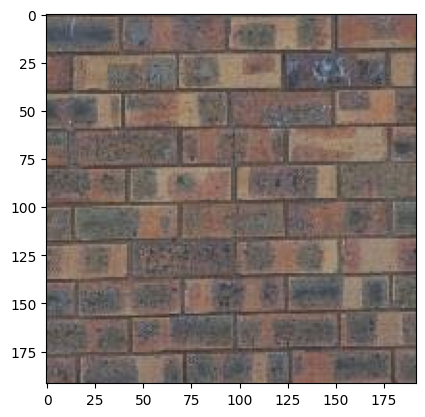

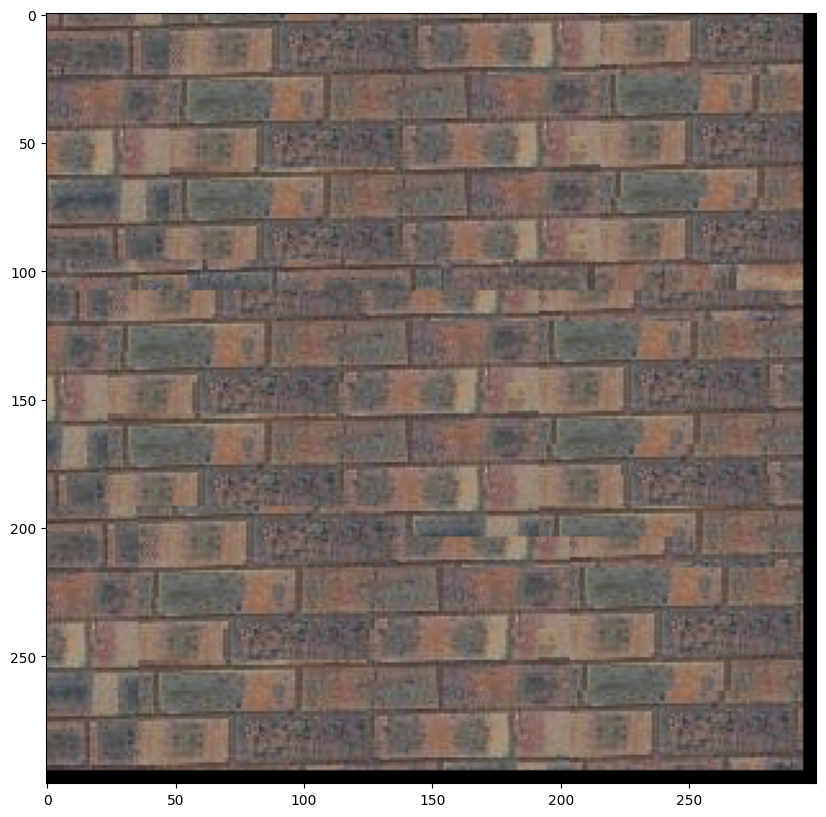

In [14]:
sample_img_fn = 'samples/bricks_small.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
# sample_img = sample_img/1.0
plt.imshow(sample_img)
plt.show()

out_size = 300  # change these parameters as needed
patch_size = 31
overlap = 19
tol = 0.0001

res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
res = res.astype(np.uint8)

if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

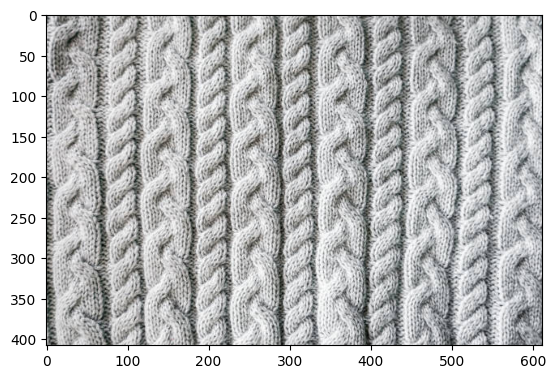

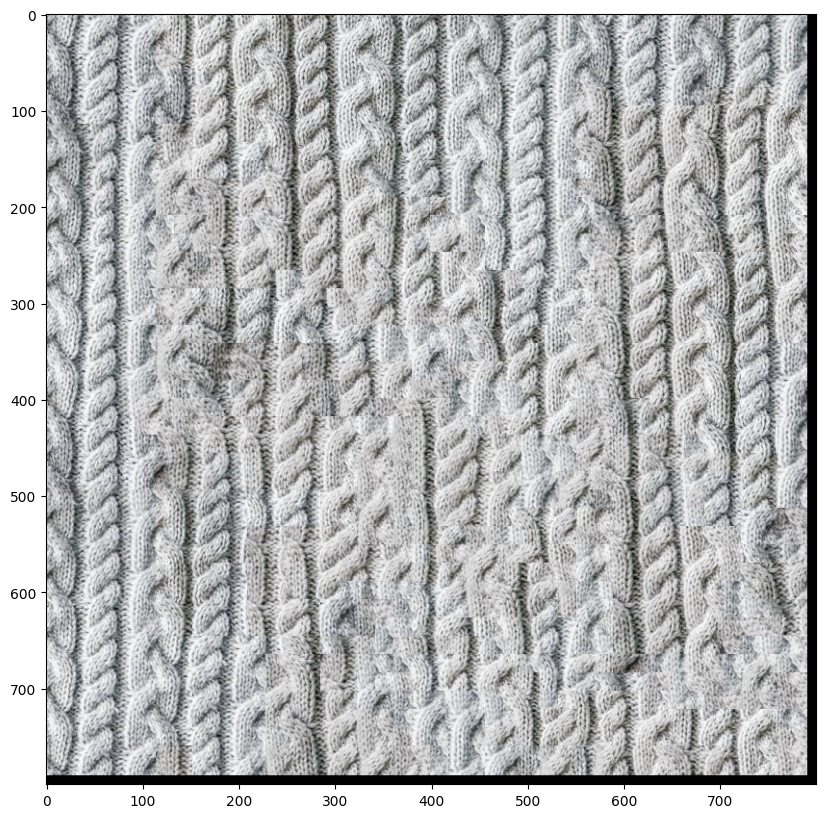

In [63]:
sample_img_fn = '/content/drive/MyDrive/CS 445/Project2/samples/texture2.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 800  # change these parameters as needed
patch_size = 31
overlap = 12
tol = 0.001
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
res = res.astype(np.uint8)

if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

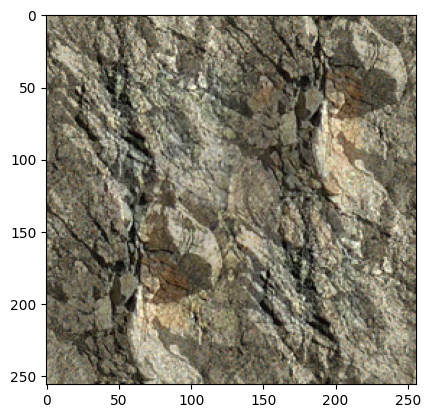

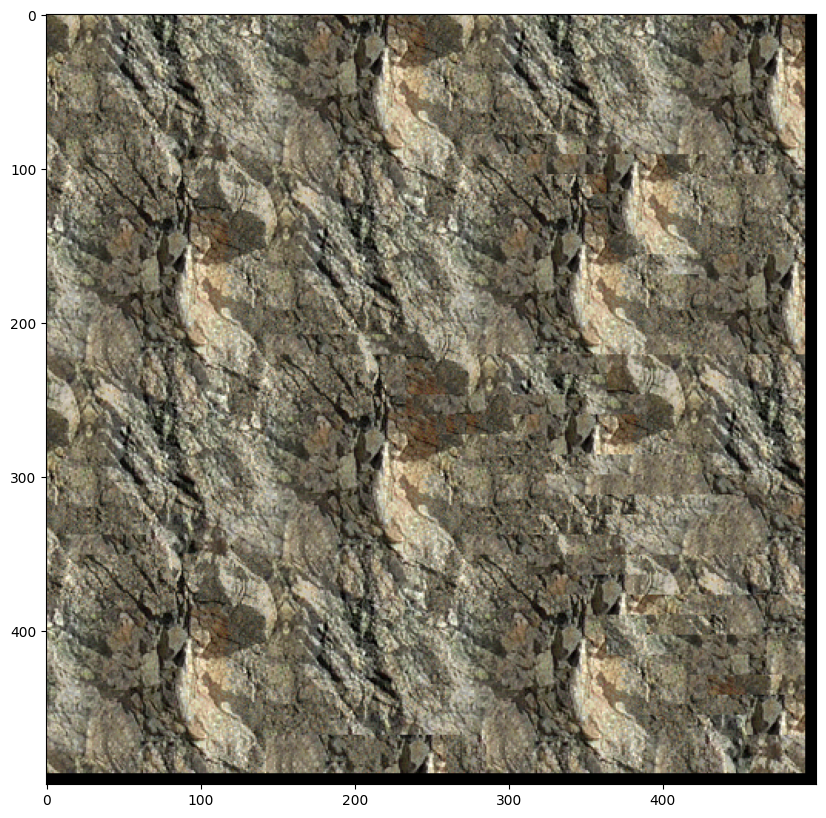

In [62]:
sample_img_fn = '/content/drive/MyDrive/CS 445/Project2/samples/texture1.png'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
# sample_img = sample_img/1.0
plt.imshow(sample_img)
plt.show()

out_size = 500  # change these parameters as needed
patch_size = 25
overlap = 12
tol = 0.0001

res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
res = res.astype(np.uint8)

if res is not None:
    plt.figure(figsize=(10,10))
    plt.imshow(res)

### Part III: Seam Finding (20 pts)


In [68]:
# optional or use cut(err_patch) directly
def customized_cut(bndcost):
    pass

In [69]:
def ssd_patch(T, M, I):
    T = T.astype(np.float64)
    I = I.astype(np.float64)
    M = M.astype(np.float64)
    ssd = np.zeros((I.shape[0], I.shape[1]))

    for i in range(3):
        ssd += ((M*T[:,:,i])**2).sum() - 2 * cv2.filter2D(I[:,:,i], ddepth=-1, kernel=M*T[:,:,i]) + cv2.filter2D(I[:,:,i] ** 2, ddepth=-1, kernel=M)

    border_width = T.shape[0] // 2
    border_height = T.shape[1] // 2
    ssd[:border_height, :] = np.inf
    ssd[-border_height:, :] = np.inf
    ssd[:, :border_width] = np.inf
    ssd[:, -border_width:] = np.inf

    # print(f"M shape: {M.shape}")
    # print(f"T shape: {T.shape}")
    # print(f"ssd shape: {ssd.shape}")
    return np.absolute(ssd)


def choose_sample(cost, tol):

    min_cost = np.amin(cost)

    # Find all indices where the cost is within tol percent of the minimum cost
    candidates = np.where(cost <= min_cost * (1 + tol))

    # Flatten the array of candidate indices
    candidate_indices = np.array(list(zip(candidates[0], candidates[1])))

    # Randomly select one index from the array of candidate indices
    row, col = candidate_indices[np.random.choice(len(candidate_indices))]

    return (row, col)

In [70]:
def quilt_cut(sample, out_size, patch_size, overlap, tol):
    output = np.zeros((out_size, out_size, 3))
    sample_height, sample_width = sample.shape[:2]

    generated_mask = np.zeros((out_size, out_size), dtype=bool)

    for i in range(0, out_size - patch_size, patch_size - overlap):
        for j in range(0, out_size - patch_size, patch_size - overlap):
            if i == 0 and j == 0:
                random_row = random.randint(0, sample_height - patch_size)
                random_col = random.randint(0, sample_width - patch_size)
                output[i:i + patch_size, j:j + patch_size] = sample[random_row:random_row + patch_size, random_col:random_col + patch_size, :]
                generated_mask[i:i + patch_size, j:j + patch_size] = True
                continue

            mask = np.zeros((patch_size, patch_size), dtype=np.float64)
            if i > 0:
                mask[:overlap, :] = 1
            if j > 0:
                mask[:, :overlap] = 1

            target = output[i:i + patch_size, j:j + patch_size, :].copy()
            ssd = ssd_patch(target, mask, sample)
            ssd = ssd[patch_size // 2: -patch_size // 2, patch_size // 2: -patch_size // 2]
            (row, col) = choose_sample(ssd, tol)
            candidate = sample[row:row + patch_size, col:col + patch_size, :]

            if generated_mask[i, j]:
                output[i:i + patch_size, j:j + patch_size] = candidate
                generated_mask[i:i + patch_size, j:j + patch_size] = True
            else:
                combined_mask = np.zeros((patch_size, patch_size), dtype=bool)

                if i > 0:
                    top_overlap = output[i:i + overlap, j:j + patch_size, :]
                    patch_top_overlap = candidate[:overlap, :, :]
                    top_bndcost = np.sum((top_overlap - patch_top_overlap) ** 2, axis=2)
                    top_mask = cut(top_bndcost).astype(bool)
                    combined_mask[:overlap, :] = top_mask

                if j > 0:
                    left_overlap = output[i:i + patch_size, j:j + overlap, :]
                    patch_left_overlap = candidate[:, :overlap, :]
                    left_bndcost = np.sum((left_overlap - patch_left_overlap) ** 2, axis=2)
                    left_mask = cut(left_bndcost.T).T.astype(bool)
                    combined_mask[:, :overlap] |= left_mask

                for c in range(3):  # Loop over color channels
                    output[i:i + patch_size, j:j + patch_size, c] = np.where(combined_mask, candidate[:, :, c], target[:, :, c])
                generated_mask[i:i + patch_size, j:j + patch_size] = True

    return output


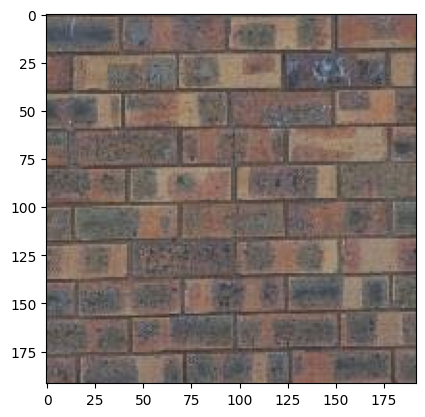

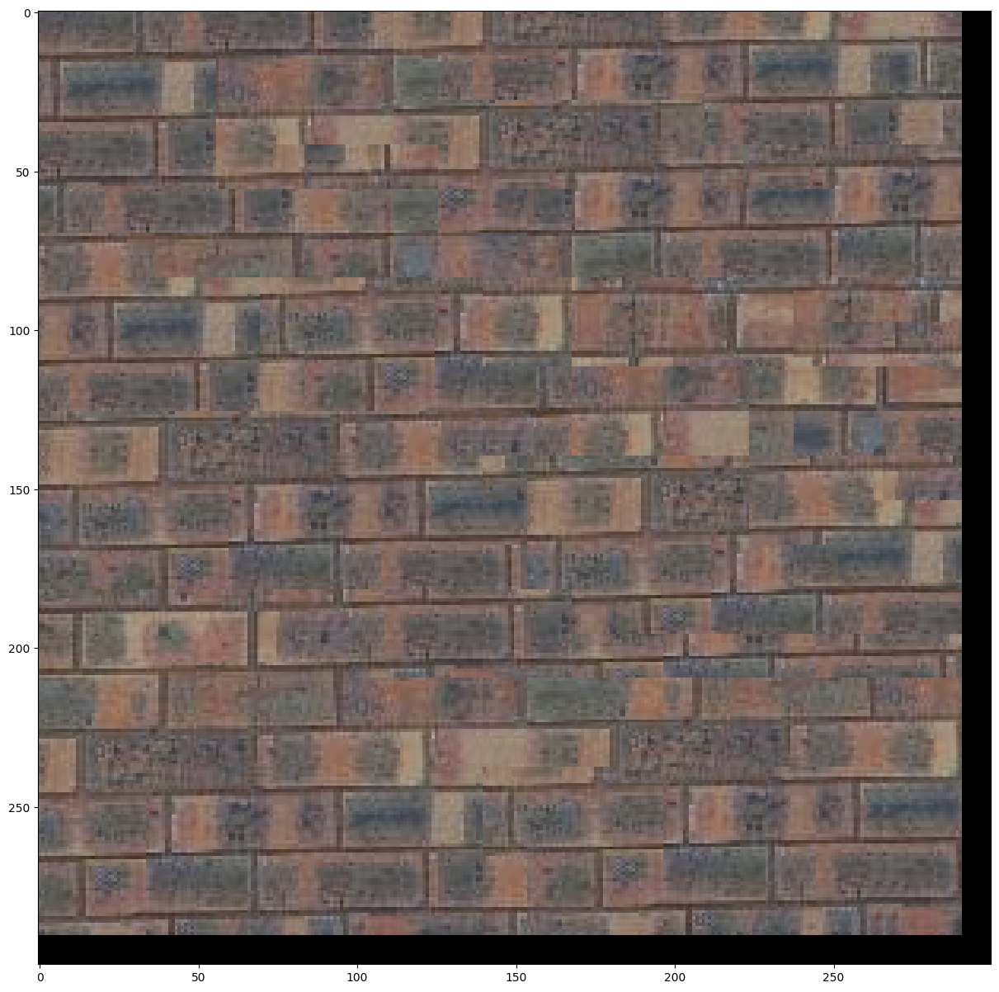

In [27]:
sample_img_fn = 'samples/bricks_small.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 300  # change these parameters as needed
patch_size = 25
overlap = 11
tol = 0.001

res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(15,15))
    plt.imshow(res/255)

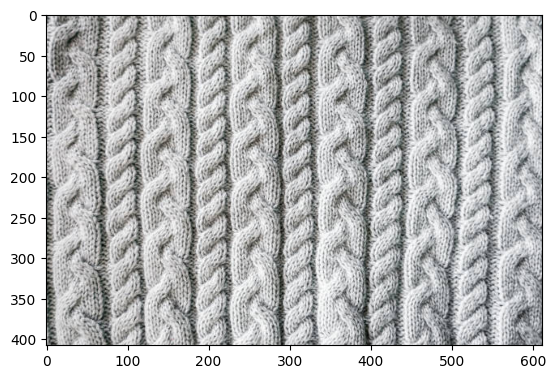

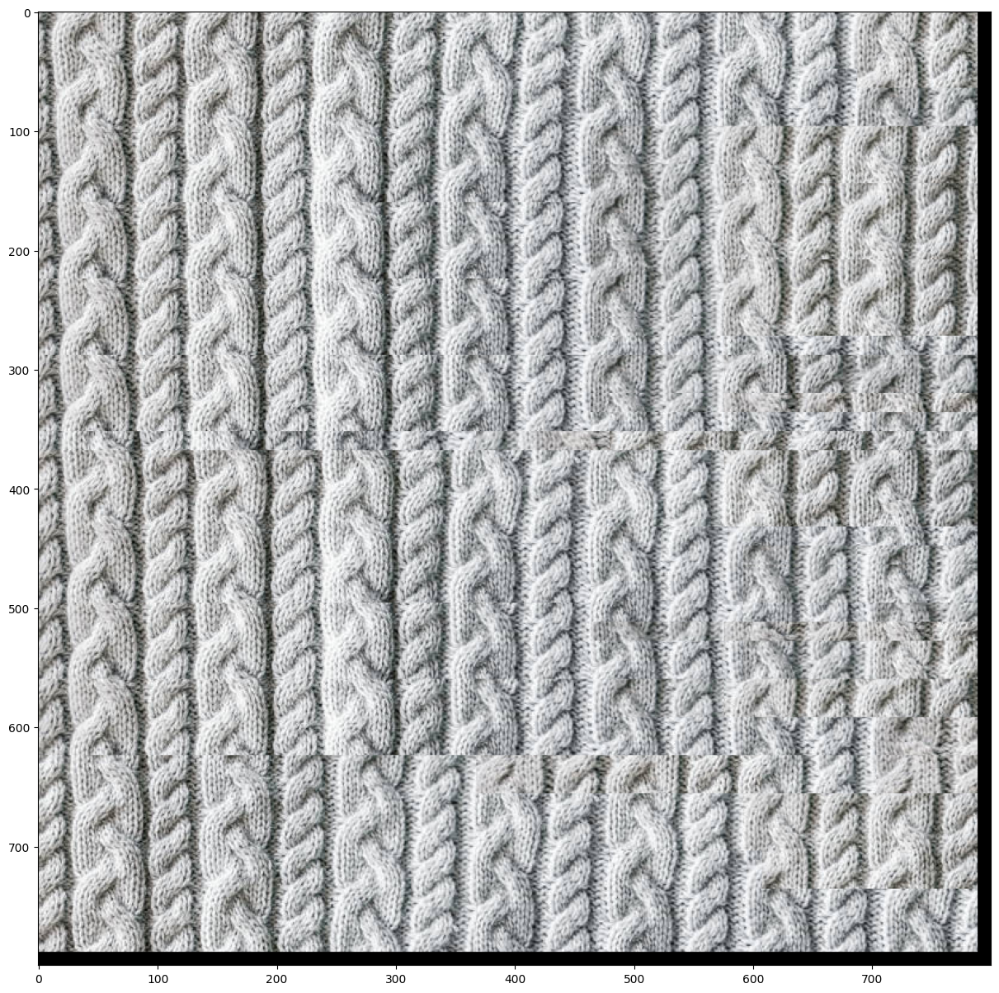

In [67]:
sample_img_fn = '/content/drive/MyDrive/CS 445/Project2/samples/texture2.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 800  # change these parameters as needed
patch_size = 53
overlap = 37
tol = 0.00001

res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(15,15))
    plt.imshow(res/255)

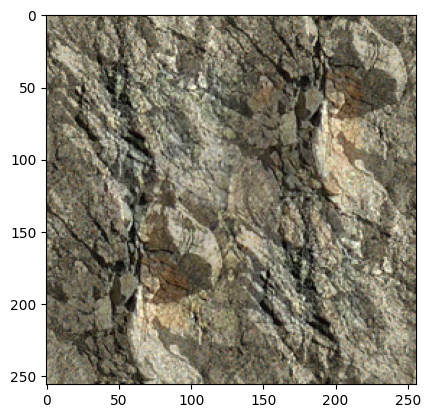

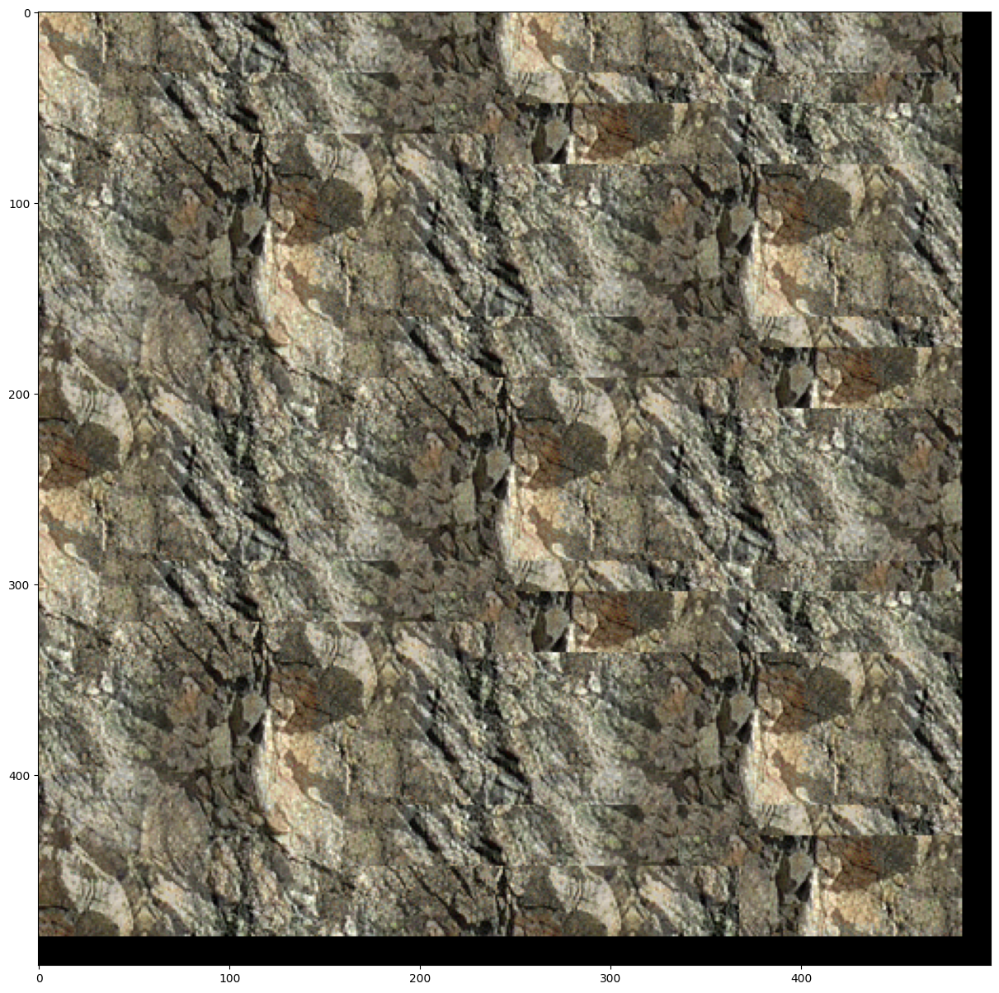

In [59]:
sample_img_fn = '/content/drive/MyDrive/CS 445/Project2/samples/texture1.png'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.show()

out_size = 500  # change these parameters as needed
patch_size = 37
overlap = 21
tol = 0.0001

res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
if res is not None:
    plt.figure(figsize=(15,15))
    plt.imshow(res/255)

Illustration: for a selected patch, display (a) the two overlapping portions; (b) pixelwise SSD cost; (c) horizontal mask; (d) vertical mask; (e) combination mask.  The mask is binary and tells which pixels come from which patch.

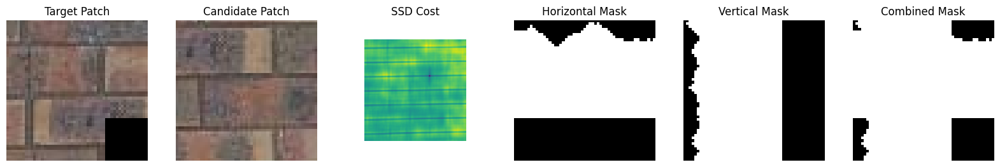

{'target': array([[[104,  94,  82],
         [109, 100,  91],
         [112, 105,  95],
         ...,
         [105, 104, 102],
         [ 88,  87,  85],
         [ 83,  81,  82]],
 
        [[109,  99,  89],
         [110, 101,  92],
         [111, 102,  93],
         ...,
         [111, 110, 108],
         [106, 104, 105],
         [ 98,  96,  97]],
 
        [[113, 103,  93],
         [113, 103,  94],
         [112, 103,  94],
         ...,
         [ 97,  97,  97],
         [108, 108, 110],
         [106, 106, 108]],
 
        ...,
 
        [[122, 100,  87],
         [122, 100,  86],
         [120,  98,  84],
         ...,
         [  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0]],
 
        [[137, 115, 102],
         [136, 114, 100],
         [131, 109,  95],
         ...,
         [  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0]],
 
        [[129, 105,  93],
         [130, 106,  94],
         [130, 108,  95],
         ...,
         [  0,   0

In [74]:
def visualize_selected_patch(sample, patch_size, overlap, i, j, ssd_patch, choose_sample, cut):
    sample_height, sample_width = sample.shape[:2]


    mask = np.zeros((patch_size, patch_size), dtype=np.float64)
    if i > 0:
        mask[:overlap, :] = 1
    if j > 0:
        mask[:, :overlap] = 1

    target = np.zeros((patch_size, patch_size, 3), dtype=sample.dtype)
    if i > 0:
        target[:overlap, :] = sample[i:i + overlap, j:j + patch_size]  # Existing patch overlap
    if j > 0:
        target[:, :overlap] = sample[i:i + patch_size, j:j + overlap]  # Existing patch overlap

    ssd_map = ssd_patch(target, mask, sample)

    (row, col) = choose_sample(ssd_map, 1)
    candidate = sample[row:row + patch_size, col:col + patch_size]

    horizontal_mask = np.zeros((patch_size, patch_size), dtype=bool)
    vertical_mask = np.zeros((patch_size, patch_size), dtype=bool)
    if i > 0:
        top_bndcost = np.sum((target[:overlap, :] - candidate[:overlap, :]) ** 2, axis=2)
        horizontal_mask[:overlap, :] = cut(top_bndcost)
    if j > 0:
        left_bndcost = np.sum((target[:, :overlap] - candidate[:, :overlap]) ** 2, axis=2)
        vertical_mask[:, :overlap] = cut(left_bndcost.T).T

    combined_mask = np.zeros((patch_size, patch_size), dtype=bool)
    combined_mask[:overlap, :] = horizontal_mask[:overlap, :]
    combined_mask[:, :overlap] |= vertical_mask[:, :overlap]


    fig, axs = plt.subplots(1, 6, figsize=(20, 4))

    # (a) The two overlapping portions
    axs[0].imshow(target)
    axs[0].set_title('Target Patch')
    axs[1].imshow(candidate)
    axs[1].set_title('Candidate Patch')

    # (b) Pixelwise SSD cost
    axs[2].imshow(ssd_map)
    axs[2].set_title('SSD Cost')

    # (c) Horizontal mask
    axs[3].imshow(horizontal_mask, cmap='gray')
    axs[3].set_title('Horizontal Mask')

    # (d) Vertical mask
    axs[4].imshow(vertical_mask, cmap='gray')
    axs[4].set_title('Vertical Mask')

    # (e) Combination mask
    combined_mask_image = horizontal_mask | vertical_mask
    axs[5].imshow(combined_mask_image, cmap='gray')
    axs[5].set_title('Combined Mask')

    for ax in axs:
        ax.axis('off')
    plt.show()

    return {
        'target': target,
        'candidate': candidate,
        'ssd_map': ssd_map,
        'horizontal_mask': horizontal_mask,
        'vertical_mask': vertical_mask,
        'combined_mask': combined_mask
    }

sample_img_fn = 'samples/bricks_small.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
visualize_selected_patch(sample_img, patch_size, overlap, 50, 89, ssd_patch, choose_sample, cut)


### part IV: Texture Transfer (30 pts)

In [31]:
def texture_transfer(sample, patch_size, overlap, tol, guidance_im, alpha):
    """
    Texture transfer function: Transfers texture from a sample image to a target image guided by another image.
    :param sample: numpy.ndarray (Source image to sample patches from)
    :param patch_size: int (Size of each square patch)
    :param overlap: int (Overlap size between patches)
    :param tol: float (Tolerance for choosing patches)
    :param guidance_im: numpy.ndarray (Target image to guide the texture transfer)
    :param alpha: float (0-1 for balancing between overlap and guidance conformity)
    :return: numpy.ndarray (Output image with transferred texture)
    """
    out_height, out_width = guidance_im.shape[:2]
    output = np.zeros((out_height, out_width, 3))
    output[:patch_size, :patch_size, :] = sample[:patch_size, :patch_size, :].copy()  # Initialize the first patch (let it not be black)

    sample_height, sample_width = sample.shape[:2]
    generated_mask = np.zeros((out_height, out_width), dtype=bool)
    for i in range(0, out_height - patch_size, patch_size - overlap):
        for j in range(0, out_width - patch_size, patch_size - overlap):
            if j + patch_size > guidance_im.shape[1]:
                break

            target = output[i:i + patch_size, j:j + patch_size, :].copy()
            guidance_patch = guidance_im[i:i + patch_size, j:j + patch_size, :]


            mask = np.zeros((patch_size, patch_size))
            if i > 0:
                mask[:overlap, :] = 1
            if j > 0:
                mask[:, :overlap] = 1

            ssd_overlap = ssd_patch(target, mask, sample)
            ssd_guidance = ssd_patch(guidance_patch, mask, sample)


            ssd_overlap = ssd_overlap[patch_size // 2: -patch_size // 2, patch_size // 2: -patch_size // 2]
            ssd_guidance = ssd_guidance[patch_size // 2: -patch_size // 2, patch_size // 2: -patch_size // 2]

            # Use the formula
            total_cost = ssd_overlap * alpha + ssd_guidance * (1 - alpha)

            (row, col) = choose_sample(total_cost, tol)
            candidate = sample[row:row + patch_size, col:col + patch_size, :]

            if generated_mask[i, j]:
                output[i:i + patch_size, j:j + patch_size] = candidate
                generated_mask[i:i + patch_size, j:j + patch_size] = True
            else:
                combined_mask = np.zeros((patch_size, patch_size), dtype=bool)

                if i > 0:
                    top_overlap = output[i:i + overlap, j:j + patch_size, :]
                    patch_top_overlap = candidate[:overlap, :, :]
                    top_bndcost = np.sum((top_overlap - patch_top_overlap) ** 2, axis=2)
                    top_mask = cut(top_bndcost).astype(bool)
                    combined_mask[:overlap, :] = top_mask

                if j > 0:
                    left_overlap = output[i:i + patch_size, j:j + overlap, :]
                    patch_left_overlap = candidate[:, :overlap, :]
                    left_bndcost = np.sum((left_overlap - patch_left_overlap) ** 2, axis=2)
                    left_mask = cut(left_bndcost.T).T.astype(bool)
                    combined_mask[:, :overlap] |= left_mask


                for c in range(3):
                    output[i:i + patch_size, j:j + patch_size, c] = np.where(combined_mask, candidate[:, :, c], target[:, :, c])
                generated_mask[i:i + patch_size, j:j + patch_size] = True

    return output


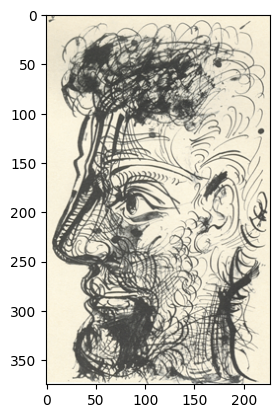

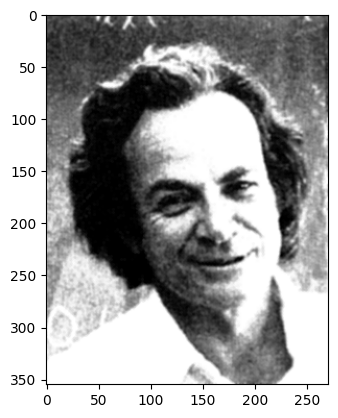

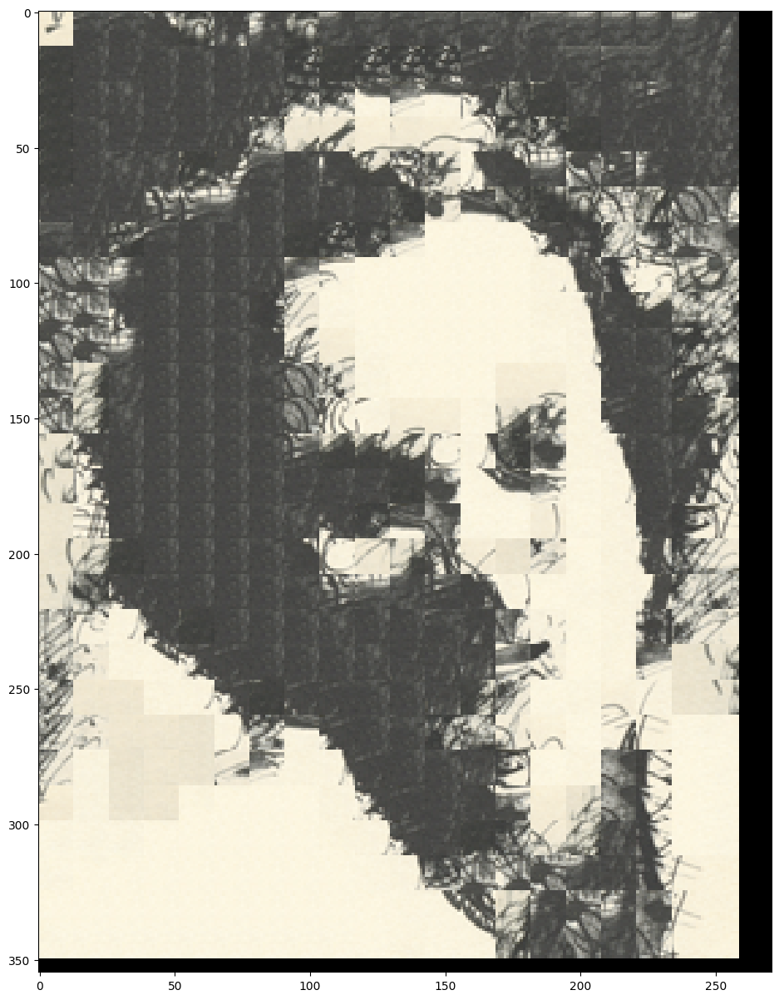

In [ ]:
texture_img = '/content/drive/MyDrive/CS 445/Project2/samples/sketch.tiff'
guidance_img = '/content/drive/MyDrive/CS 445/Project2/samples/feynman.tiff'

texture_img = cv2.cvtColor(cv2.imread(texture_img), cv2.COLOR_BGR2RGB)
plt.imshow(texture_img)
plt.show()

guidance_img = cv2.cvtColor(cv2.imread(guidance_img), cv2.COLOR_BGR2RGB)
plt.imshow(guidance_img)
plt.show()

patch_size = 25
overlap = 12
tol = 0.00005
alpha = 0.00009


# Call texture_transfer function
res = texture_transfer(texture_img, patch_size, overlap, tol, guidance_img, alpha)
res = res.astype(np.uint8)

# Display result
plt.figure(figsize=(15, 15))
plt.imshow(res)
plt.show()


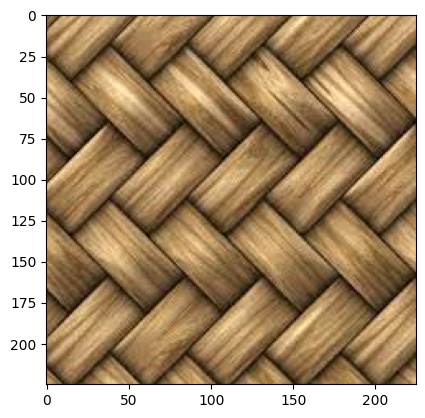

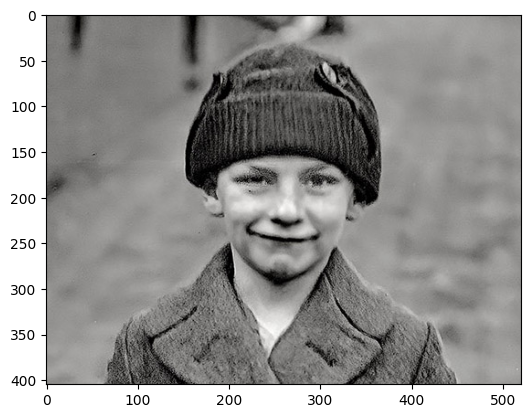

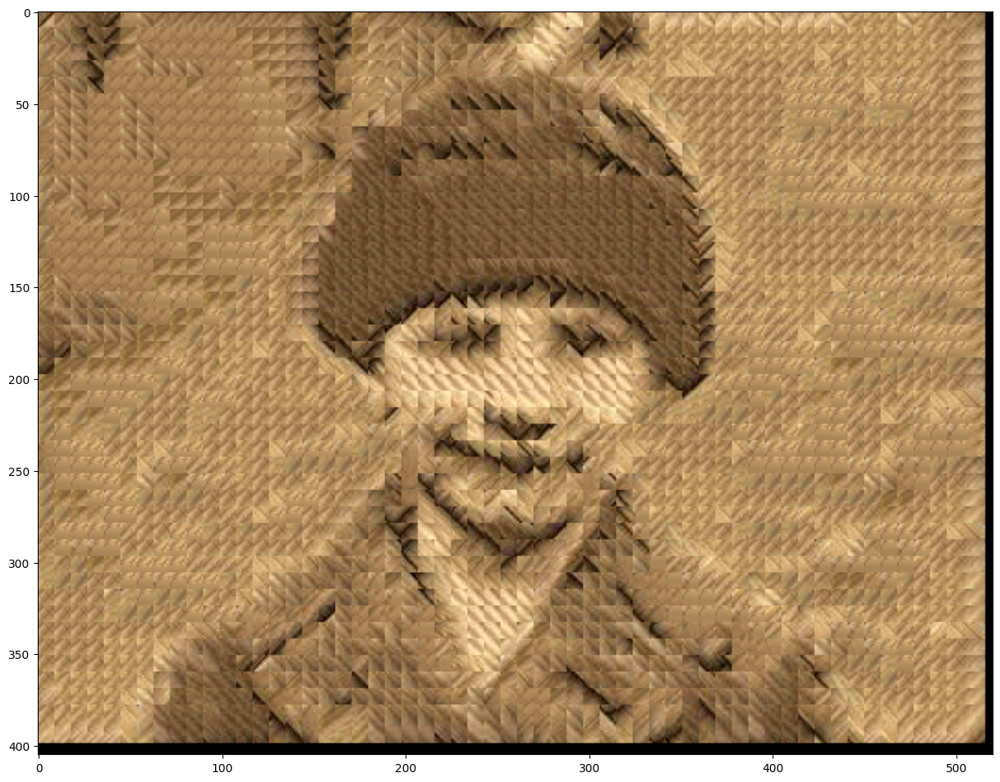

In [47]:
texture_img = '/content/drive/MyDrive/CS 445/Project2/samples/texture5.jpg'
guidance_img = '/content/drive/MyDrive/CS 445/Project2/samples/guidance5.jpeg'

texture_img = cv2.cvtColor(cv2.imread(texture_img), cv2.COLOR_BGR2RGB)
plt.imshow(texture_img)
plt.show()

guidance_img = cv2.cvtColor(cv2.imread(guidance_img), cv2.COLOR_BGR2RGB)
plt.imshow(guidance_img)
plt.show()

patch_size = 21
overlap = 12
tol = 0.00005
alpha = 0.00005


# Call texture_transfer function
res = texture_transfer(texture_img, patch_size, overlap, tol, guidance_img, alpha)
res = res.astype(np.uint8)

# Display result
plt.figure(figsize=(15, 15))
plt.imshow(res)
plt.show()


### Bells & Whistles

(15 pts) Implement the iterative texture transfer method described in the paper. Compare to the non-iterative method for two examples.

(up to 20 pts) Use a combination of texture transfer and blending to create a face-in-toast image like the one on top. To get full points, you must use some type of blending, such as feathering or Laplacian pyramid blending.

(up to 40 pts) Extend your method to fill holes of arbitrary shape for image completion. In this case, patches are drawn from other parts of the target image. For the full 40 pts, you should implement a smart priority function (e.g., similar to Criminisi et al.).

https://freestocktextures.com/texture/old-wood,1649.html